In [ ]:
# Requirements:
# pip install torch torchvision scikit-learn pillow tqdm matplotlib

import os, random
from pathlib import Path
from collections import Counter
import numpy as np
from PIL import Image
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, confusion_matrix, classification_report
from tqdm import tqdm
import matplotlib.pyplot as plt

# ------------- CONFIG -------------
root = Path(r"D:\myproject\cnn_classifier\clinical_oral\Oral Cancer Dataset")  # <- your folder
# expected structure:
# D:\clinical_oral\Oral Cancer Dataset\cancer\*.jpg
# D:\clinical_oral\Oral Cancer Dataset\non cancer\*.jpg
seed = 42
random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)
img_size = 224
bs = 16
epochs = 12
lr = 1e-4
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = "best_resnet50_clinical_windows.pth"
num_workers = 0  # set >0 if running on Linux/Colab

# ------------- COLLECT IMAGES -------------
classes = sorted([p.name for p in root.iterdir() if p.is_dir()])
paths=[]; labels=[]
for i,c in enumerate(classes):
    for p in (root/c).glob("*"):
        if p.suffix.lower() in [".jpg",".jpeg",".png",".bmp",".tif",".tiff"]:
            paths.append(str(p))
            labels.append(i)
print("Classes (detected):", classes)
print("Total images found:", len(paths))
# sanity counts
cnt = Counter(labels)
for i in sorted(cnt):
    print(f"  {classes[i]} : {cnt[i]}")

# ------------- STRATIFIED SPLIT (80/20) -------------
train_idx, val_idx = train_test_split(range(len(paths)), test_size=0.2, stratify=labels, random_state=seed)
train_labels = [labels[i] for i in train_idx]
val_labels = [labels[i] for i in val_idx]

# ------------- TRANSFORMS -------------
train_tf = transforms.Compose([
    transforms.RandomResizedCrop(img_size, scale=(0.8,1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(0.15,0.15,0.1,0.05),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])
val_tf = transforms.Compose([
    transforms.Resize((img_size,img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

# ------------- DATASET -------------
class ImgDataset(Dataset):
    def __init__(self, paths, labels, transform=None):
        self.paths, self.labels, self.t = paths, labels, transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, i):
        img = Image.open(self.paths[i]).convert("RGB")
        if self.t: img = self.t(img)
        return img, self.labels[i]

train_ds = ImgDataset([paths[i] for i in train_idx], train_labels, transform=train_tf)
val_ds   = ImgDataset([paths[i] for i in val_idx],   val_labels,   transform=val_tf)

# ------------- WEIGHTED SAMPLER (balance batches) -------------
class_counts = Counter(train_labels)
print("Train class counts:", class_counts)
weights = [1.0 / class_counts[l] for l in train_labels]
sampler = WeightedRandomSampler(weights, num_samples=len(weights), replacement=True)

train_loader = DataLoader(train_ds, batch_size=bs, sampler=sampler, num_workers=num_workers)
val_loader   = DataLoader(val_ds, batch_size=bs, shuffle=False, num_workers=num_workers)

# ------------- MODEL (ResNet50 transfer learning) -------------
model = models.resnet50(pretrained=True)
nfeats = model.fc.in_features
model.fc = nn.Linear(nfeats, len(classes))
# freeze except layer4 and fc
for name, p in model.named_parameters():
    if "layer4" not in name and "fc" not in name:
        p.requires_grad = False
model = model.to(device)

# class weights for loss (help minority class)
# formula: total/(num_classes * count[class])
total = len(train_labels); n_classes = len(class_counts)
class_weights = []
for i in range(n_classes):
    ccount = class_counts.get(i, 1)
    class_weights.append(total / (n_classes * ccount))
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
print("Class weights used for loss:", class_weights.cpu().numpy())

criterion = nn.CrossEntropyLoss(weight=class_weights)
opt = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=lr)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode='max', patience=2, factor=0.5)

# ------------- TRAIN / VALIDATE -------------
best_auc = 0.0
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    for xb, yb in tqdm(train_loader, desc=f"Train E{epoch+1}/{epochs}"):
        xb, yb = xb.to(device), yb.to(device)
        opt.zero_grad()
        out = model(xb)
        loss = criterion(out, yb)
        loss.backward()
        opt.step()
        running_loss += loss.item() * xb.size(0)

    # validation
    model.eval()
    all_probs=[]; all_preds=[]; all_labels=[]
    with torch.no_grad():
        for xb, yb in val_loader:
            xb = xb.to(device); yb = yb.to(device)
            logits = model(xb)
            if len(classes)==2:
                probs = torch.softmax(logits, dim=1)[:,1].cpu().numpy()
                all_probs.extend(probs.tolist())
            preds = logits.argmax(dim=1).cpu().numpy()
            all_preds.extend(preds.tolist()); all_labels.extend(yb.cpu().numpy().tolist())

    if all_probs:
        auc = roc_auc_score(all_labels, all_probs)
    else:
        auc = 0.0
    print(f"\nEpoch {epoch+1} | Val AUC: {auc:.4f}")
    print(classification_report(all_labels, all_preds, target_names=classes, zero_division=0))
    print("Confusion matrix:\n", confusion_matrix(all_labels, all_preds))

    sched.step(auc)
    if auc > best_auc:
        best_auc = auc
        torch.save(model.state_dict(), model_path)
        print("Saved best model.")
print("Training finished. Best AUC:", best_auc)

# ------------- QUICK VISUAL CHECK (Grad-CAM overlay) -------------
def imshow_tensor(tensor):
    t = tensor.cpu().permute(1,2,0).numpy()
    mean = np.array([0.485,0.456,0.406]); std = np.array([0.229,0.224,0.225])
    img = (t * std + mean).clip(0,1)
    plt.imshow(img); plt.axis('off')

def grad_cam(model, img_tensor, target_layer_name="layer4"):
    model.eval()
    img_tensor = img_tensor.unsqueeze(0).to(device)
    grads=[]; acts=[]
    def save_act(m, i, o): acts.append(o.detach())
    def save_grad(m, gi, go): grads.append(go[0].detach())
    for n,m in model.named_modules():
        if n==target_layer_name:
            h1 = m.register_forward_hook(save_act)
            h2 = m.register_full_backward_hook(save_grad)
            break
    out = model(img_tensor)
    cls = out.argmax(dim=1).item()
    loss = out[0, cls]; model.zero_grad(); loss.backward()
    act = acts[-1].squeeze(0); grad = grads[-1].squeeze(0)
    weights = grad.mean(dim=(1,2))
    cam = (weights[:,None,None] * act).sum(dim=0).cpu().numpy()
    cam = np.maximum(cam,0); cam = cam - cam.min(); cam = cam / (cam.max()+1e-8)
    cam = (cam * 255).astype('uint8')
    cam = Image.fromarray(cam).resize((img_size,img_size), resample=Image.BILINEAR)
    h1.remove(); h2.remove()
    return np.array(cam)/255.0

# show one val sample and CAM
sample_img, sample_label = val_ds[0]
imshow_tensor(sample_img); plt.title(f"Label: {classes[sample_label]}"); plt.show()
cam = grad_cam(model, sample_img)
plt.imshow(cam, alpha=0.5); plt.axis('off'); plt.title("Grad-CAM Overlay"); plt.show()


#testing model


Using device: cuda
Model loaded successfully!

Prediction: CANCER
Confidence: 99.97%



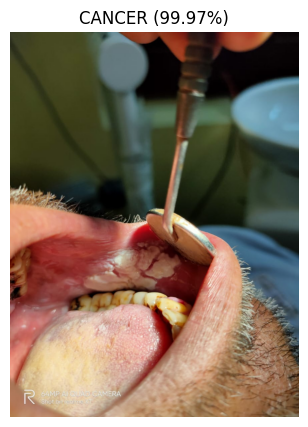

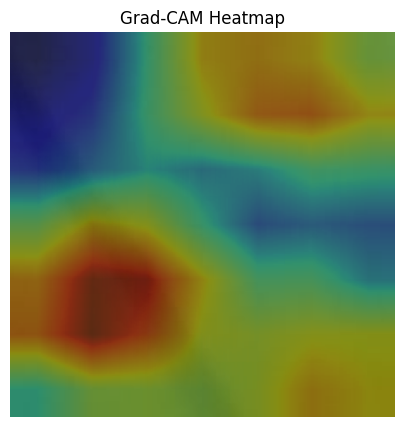

In [2]:
import torch
from torchvision import models, transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# DEVICE SETUP
# -----------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# -----------------------------
# LOAD TRAINED MODEL
# -----------------------------
num_classes = 2  # CANCER, NON CANCER
model = models.resnet50(pretrained=False)
model.fc = torch.nn.Linear(model.fc.in_features, num_classes)

model.load_state_dict(torch.load("best_resnet50_clinical_windows.pth", map_location=device))
model.to(device)
model.eval()

print("Model loaded successfully!")


# -----------------------------
# SAME TRANSFORMS AS TRAINING
# -----------------------------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

class_names = ["CANCER", "NON CANCER"]  # match your folder order


# -----------------------------
# PREDICTION FUNCTION
# -----------------------------
def predict_image(img_path):
    img = Image.open(img_path).convert("RGB")
    inp = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(inp)
        probs = torch.softmax(outputs, dim=1)[0]

    pred_idx = torch.argmax(probs).item()
    pred_class = class_names[pred_idx]
    confidence = float(probs[pred_idx].item())

    return img, pred_class, confidence, inp


# -----------------------------
# OPTIONAL — GRAD-CAM VISUALIZATION
# -----------------------------
def grad_cam(model, img_tensor, target_layer="layer4"):
    model.eval()
    gradients = []
    activations = []

    def save_activation(module, input, output):
        activations.append(output.detach())

    def save_gradient(module, grad_input, grad_output):
        gradients.append(grad_output[0].detach())

    # register hooks
    for name, module in model.named_modules():
        if name == target_layer:
            h1 = module.register_forward_hook(save_activation)
            h2 = module.register_full_backward_hook(save_gradient)
            break

    # forward
    out = model(img_tensor)
    pred_class = out.argmax(dim=1).item()
    loss = out[0, pred_class]
    model.zero_grad()
    loss.backward()

    # compute CAM
    act = activations[0].squeeze(0)           # C,H,W
    grad = gradients[0].squeeze(0)            # C,H,W
    weights = grad.mean(dim=(1, 2))           # C
    cam = (weights[:, None, None] * act).sum(dim=0)
    cam = np.maximum(cam.cpu().numpy(), 0)
    cam = cam - cam.min()
    cam = cam / (cam.max() + 1e-8)
    cam = (cam * 255).astype(np.uint8)

    # resize to image size
    cam = Image.fromarray(cam).resize((224, 224), Image.BILINEAR)

    h1.remove()
    h2.remove()

    return cam


# -----------------------------
# MAIN — TEST YOUR IMAGE
# -----------------------------
if __name__ == "__main__":
    img_path = r"D:\myproject\cnn_classifier\clinical_oral\Oral Cancer Dataset\test\013.jpeg"  # <--- change your image path here

    img, pred_class, conf, img_tensor = predict_image(img_path)
    print(f"\nPrediction: {pred_class}")
    print(f"Confidence: {conf*100:.2f}%\n")

    # show original
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(f"{pred_class} ({conf*100:.2f}%)")
    plt.axis("off")
    plt.show()

    # show Grad-CAM
    cam = grad_cam(model, img_tensor)
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.imshow(cam, cmap="jet", alpha=0.4)
    plt.title("Grad-CAM Heatmap")
    plt.axis("off")
    plt.show()



Using device: cuda
Model loaded successfully!
Found 46 test images.


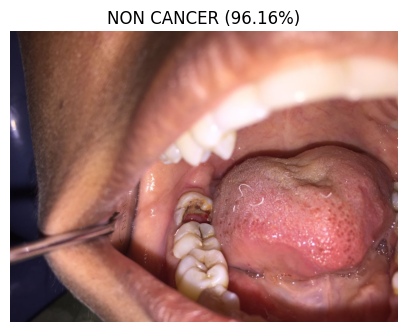

001.jpeg --> NON CANCER (96.16%)


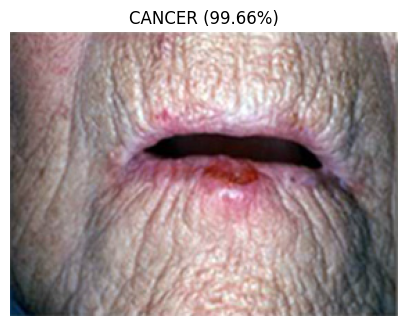

002.jpeg --> CANCER (99.66%)


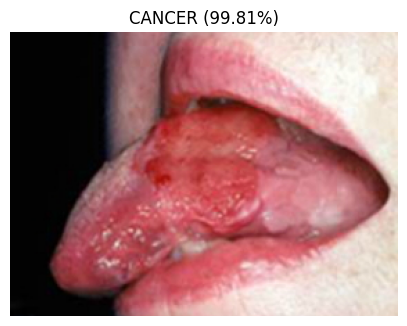

003.jpeg --> CANCER (99.81%)


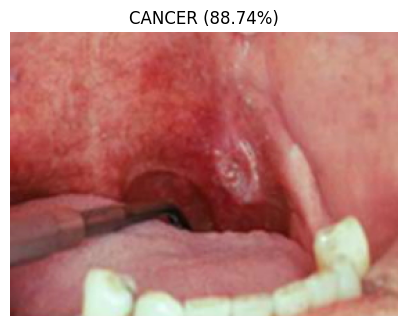

004.jpeg --> CANCER (88.74%)


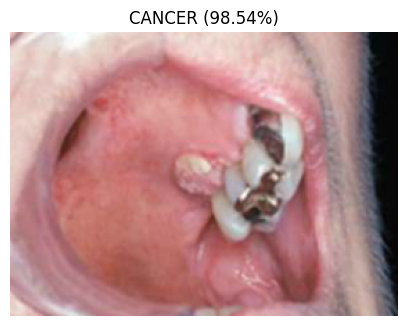

005.jpeg --> CANCER (98.54%)


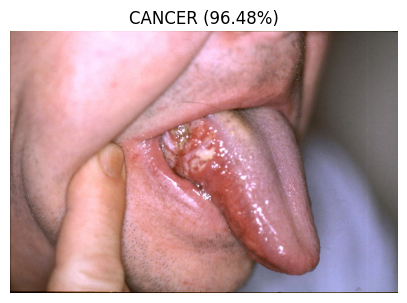

006.jpeg --> CANCER (96.48%)


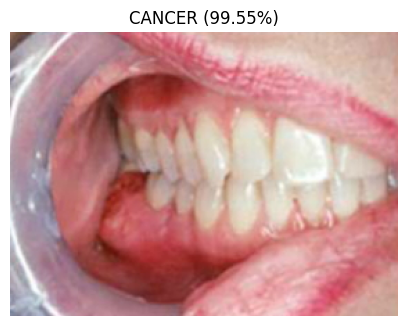

007.jpeg --> CANCER (99.55%)


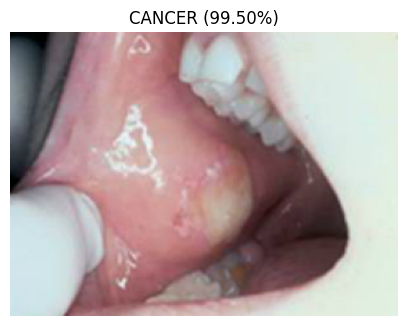

008.jpeg --> CANCER (99.50%)


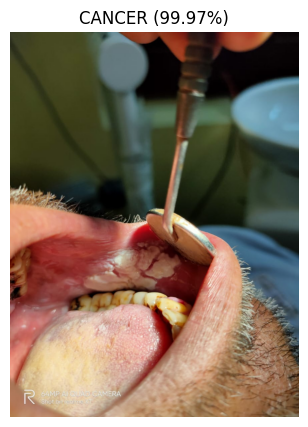

013.jpeg --> CANCER (99.97%)


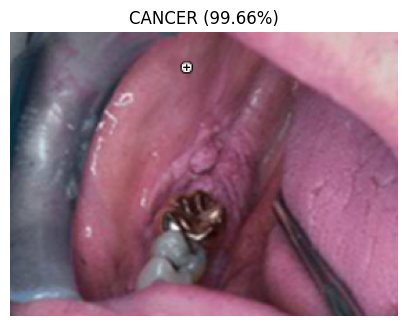

014.jpeg --> CANCER (99.66%)


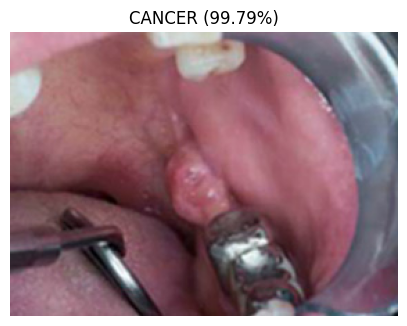

015.jpeg --> CANCER (99.79%)


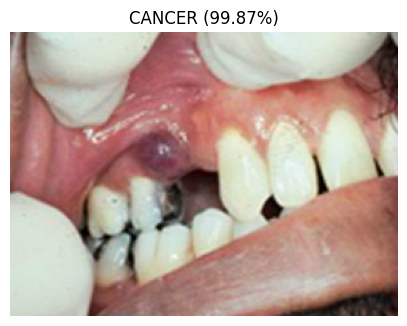

016.jpeg --> CANCER (99.87%)


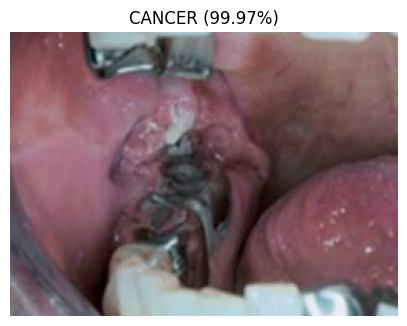

017.jpeg --> CANCER (99.97%)


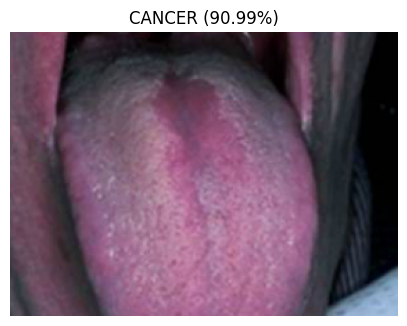

018.jpeg --> CANCER (90.99%)


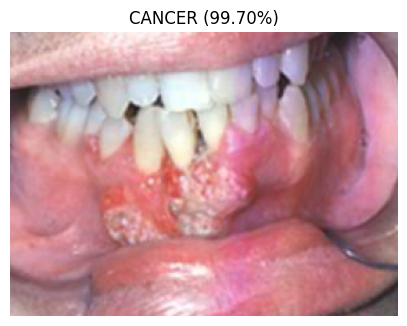

019.jpeg --> CANCER (99.70%)


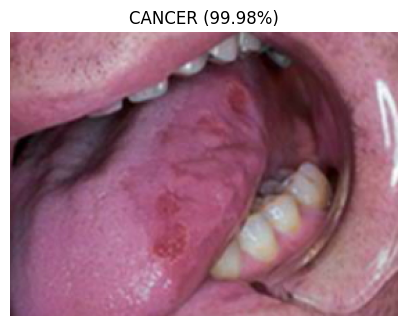

020.jpeg --> CANCER (99.98%)


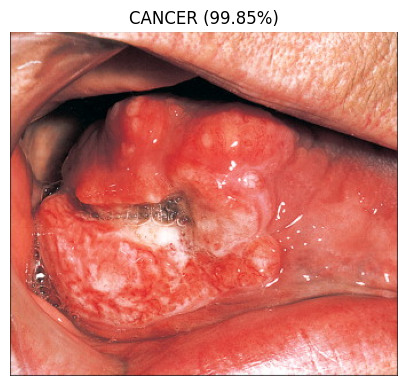

025.jpeg --> CANCER (99.85%)


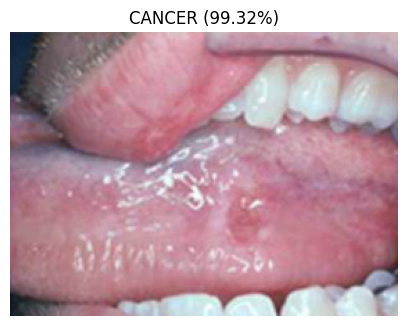

026.jpeg --> CANCER (99.32%)


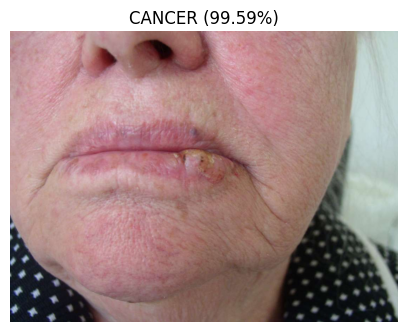

027.jpeg --> CANCER (99.59%)


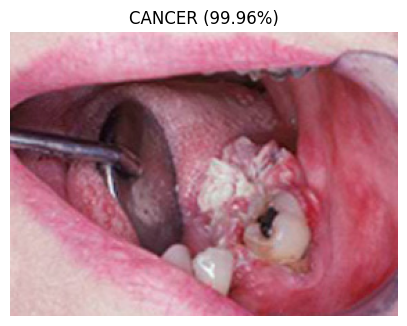

028.jpeg --> CANCER (99.96%)


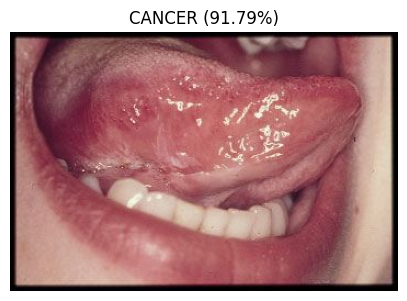

029.jpeg --> CANCER (91.79%)


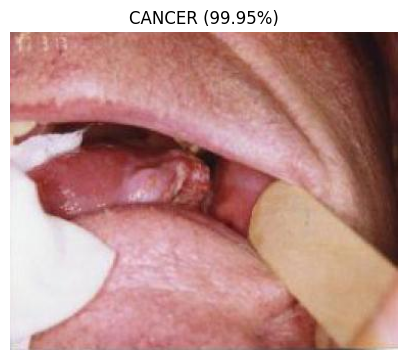

030.jpeg --> CANCER (99.95%)


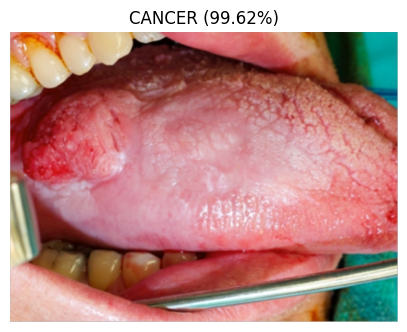

031.jpeg --> CANCER (99.62%)


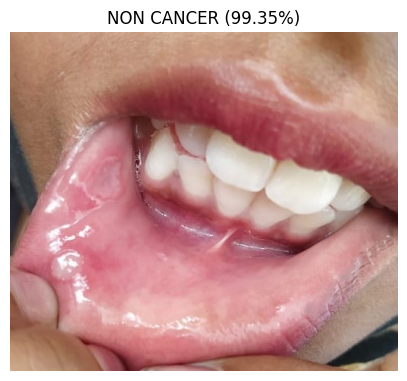

097.jpeg --> NON CANCER (99.35%)


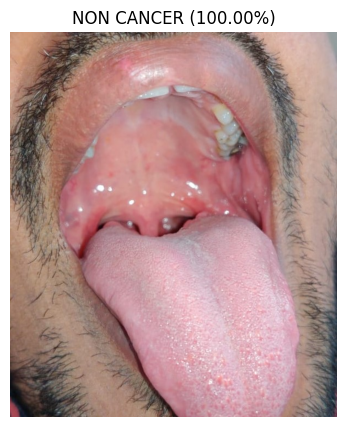

098.jpeg --> NON CANCER (100.00%)


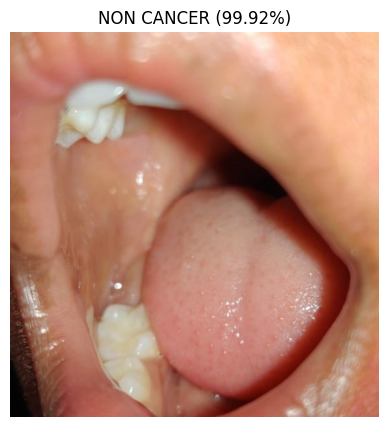

099.jpeg --> NON CANCER (99.92%)


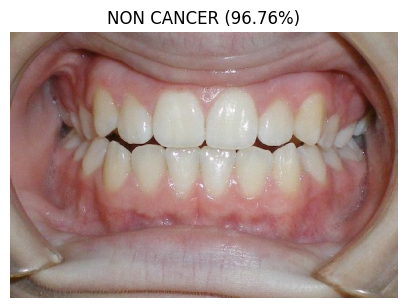

101.jpeg --> NON CANCER (96.76%)


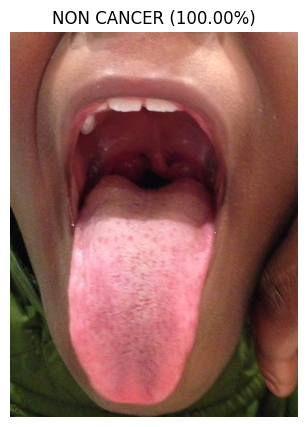

102.jpeg --> NON CANCER (100.00%)


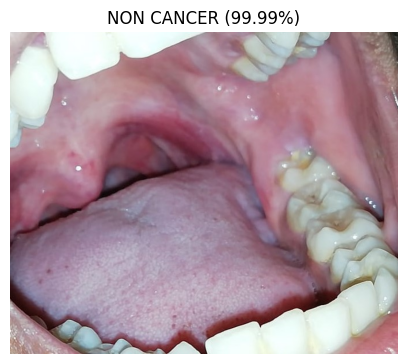

109.jpeg --> NON CANCER (99.99%)


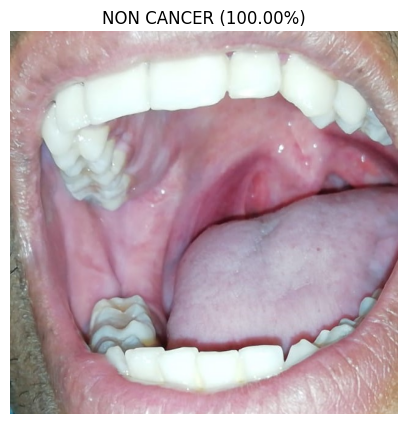

110.jpeg --> NON CANCER (100.00%)


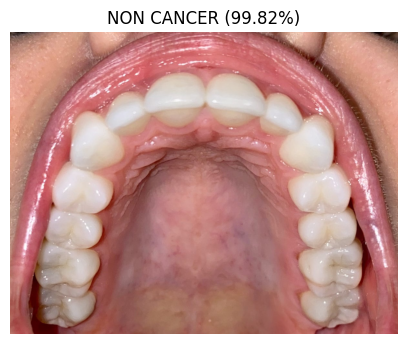

111.jpeg --> NON CANCER (99.82%)


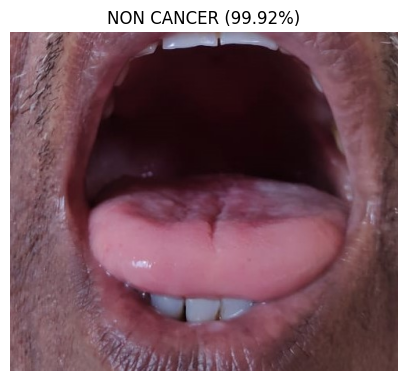

112.jpeg --> NON CANCER (99.92%)


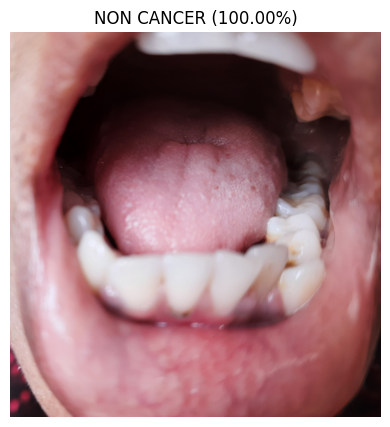

113.jpeg --> NON CANCER (100.00%)


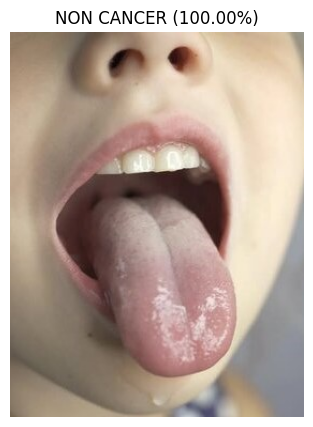

114.jpeg --> NON CANCER (100.00%)


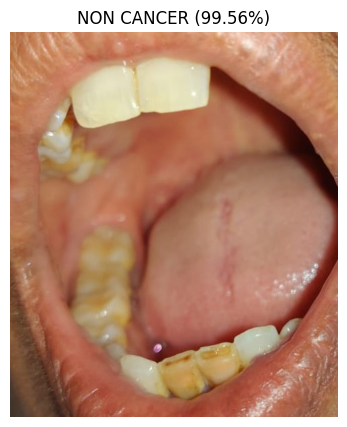

121.jpeg --> NON CANCER (99.56%)


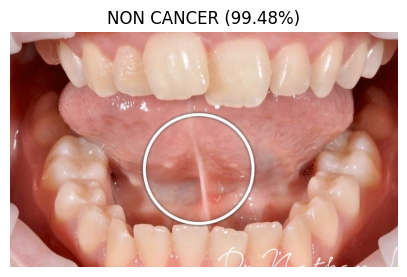

122.jpeg --> NON CANCER (99.48%)


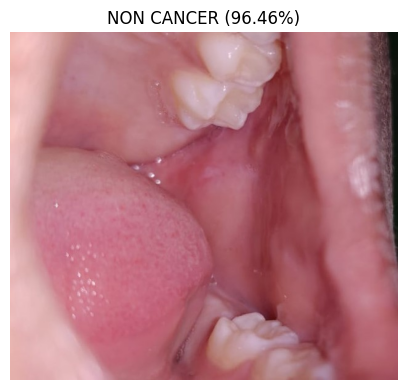

123.jpeg --> NON CANCER (96.46%)


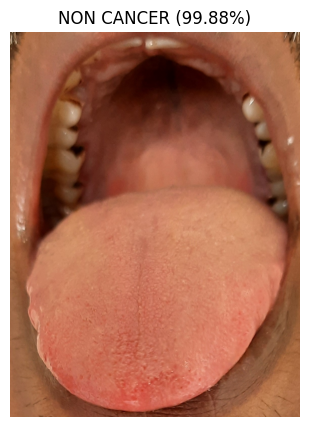

124.jpeg --> NON CANCER (99.88%)


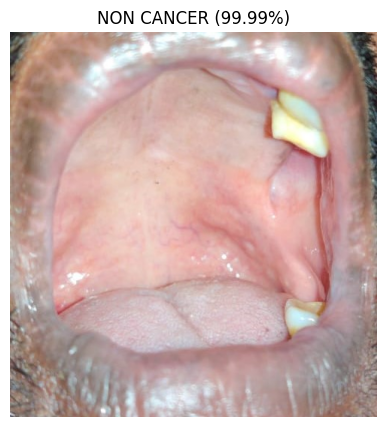

125.jpeg --> NON CANCER (99.99%)


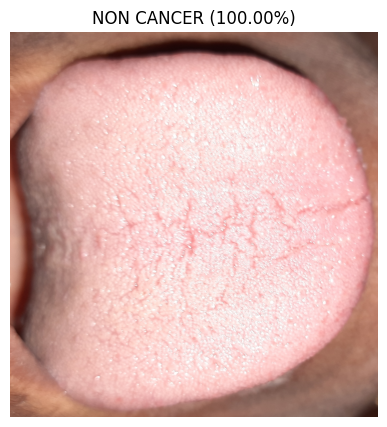

126.jpeg --> NON CANCER (100.00%)


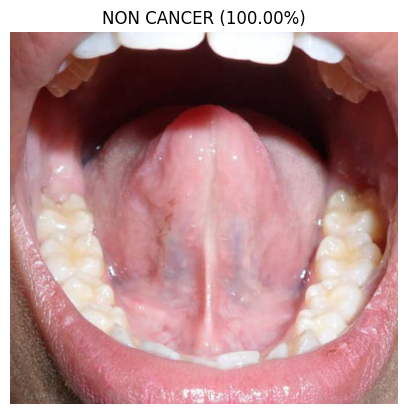

133.jpeg --> NON CANCER (100.00%)


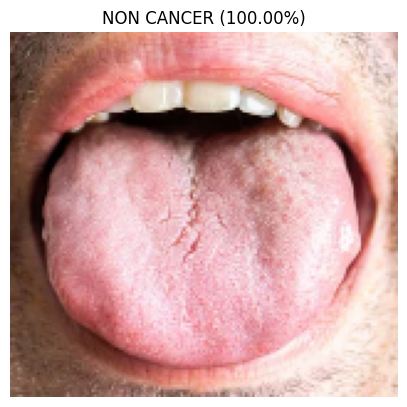

134.jpeg --> NON CANCER (100.00%)


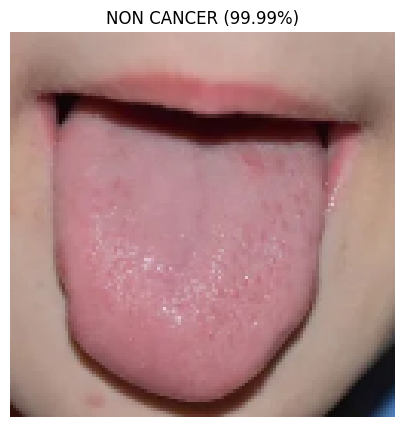

135.jpeg --> NON CANCER (99.99%)


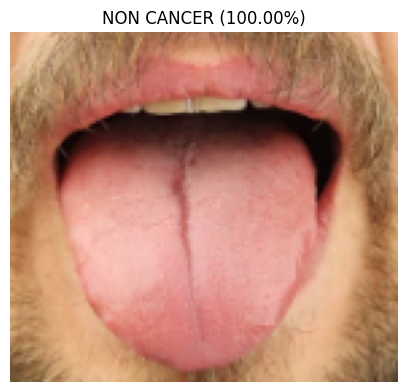

136.jpeg --> NON CANCER (100.00%)


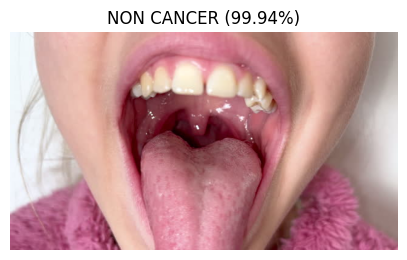

137.jpeg --> NON CANCER (99.94%)


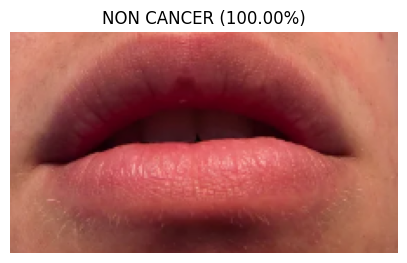

138.jpeg --> NON CANCER (100.00%)
Done testing all images!


In [5]:
import torch
from torchvision import models, transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import time
import os

# -----------------------------
# DEVICE
# -----------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# -----------------------------
# LOAD MODEL
# -----------------------------
num_classes = 2
model = models.resnet50(pretrained=False)
model.fc = torch.nn.Linear(model.fc.in_features, num_classes)

model.load_state_dict(torch.load("best_resnet50_clinical_windows.pth", map_location=device))
model.to(device)
model.eval()

print("Model loaded successfully!")

# -----------------------------
# TRANSFORMS (same as training)
# -----------------------------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

class_names = ["CANCER", "NON CANCER"]


# -----------------------------
# PREDICTION FUNCTION
# -----------------------------
def predict_image(img_path):
    img = Image.open(img_path).convert("RGB")
    inp = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(inp)
        probs = torch.softmax(outputs, dim=1)[0]

    pred_idx = torch.argmax(probs).item()
    pred_class = class_names[pred_idx]
    confidence = float(probs[pred_idx].item())

    return img, pred_class, confidence


# -----------------------------
# RUN ON ALL IMAGES IN TEST FOLDER
# -----------------------------
test_folder = r"D:\myproject\cnn_classifier\clinical_oral\Oral Cancer Dataset\test"   # <-- CHANGE YOUR TEST FOLDER PATH

image_extensions = (".jpg", ".jpeg", ".png", ".bmp", ".tiff")

files = [f for f in os.listdir(test_folder) if f.lower().endswith(image_extensions)]

print(f"Found {len(files)} test images.")

for file in files:
    path = os.path.join(test_folder, file)

    img, pred_class, conf = predict_image(path)

    # show image for 0.5 seconds
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(f"{pred_class} ({conf*100:.2f}%)")
    plt.axis("off")
    plt.draw()
    plt.pause(0.5)    # show for 0.5 seconds
    plt.close()

    print(f"{file} --> {pred_class} ({conf*100:.2f}%)")

print("Done testing all images!")


In [4]:
import cv2
import torch
from torchvision import models, transforms
from PIL import Image
import numpy as np
import time

# -----------------------------
# DEVICE
# -----------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# -----------------------------
# LOAD MODEL
# -----------------------------
num_classes = 2
model = models.resnet50(pretrained=False)
model.fc = torch.nn.Linear(model.fc.in_features, num_classes)

model.load_state_dict(torch.load("best_resnet50_clinical_windows.pth", map_location=device))
model.to(device)
model.eval()

print("Model loaded successfully!")

# -----------------------------
# TRANSFORMS (same as training)
# -----------------------------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

class_names = ["CANCER", "NON CANCER"]

# -----------------------------
# PREDICT FROM PIL IMAGE
# -----------------------------
def predict_pil(pil_img):
    inp = transform(pil_img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(inp)
        probs = torch.softmax(outputs, dim=1)[0]

    pred_idx = torch.argmax(probs).item()
    pred_class = class_names[pred_idx]
    confidence = float(probs[pred_idx].item())

    return pred_class, confidence


# -----------------------------
# OPEN WEBCAM + CAPTURE
# -----------------------------
def webcam_predict():
    cap = cv2.VideoCapture(0)  # 0 = default webcam
    if not cap.isOpened():
        print("❌ ERROR: Cannot access webcam!")
        return

    print("📸 Press SPACE to capture image")
    print("❌ Press Q to quit")

    while True:
        ret, frame = cap.read()
        if not ret:
            print("❌ Failed to grab frame")
            break

        # Show webcam feed
        cv2.imshow("Webcam - Press SPACE to capture", frame)
        key = cv2.waitKey(1) & 0xFF

        # --- Press SPACE to capture ---
        if key == ord(' '):
            img_bgr = frame.copy()
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
            pil_img = Image.fromarray(img_rgb)

            pred_class, conf = predict_pil(pil_img)

            print("\n========== RESULT ==========")
            print(f"Prediction: {pred_class}")
            print(f"Confidence: {conf*100:.2f}%")
            print("============================\n")

            # Show captured image + prediction
            result_img = img_bgr.copy()
            text = f"{pred_class} ({conf*100:.1f}%)"
            cv2.putText(result_img, text, (10, 40),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0,255,0), 2)

            cv2.imshow("Prediction", result_img)
            cv2.waitKey(2000)  # show for 2 seconds
            cv2.destroyWindow("Prediction")

        # --- Press Q to quit ---
        elif key == ord('q'):
            break

    cap.release()
    cv2.destroyAllWindows()


# -----------------------------
# RUN
# -----------------------------
if __name__ == "__main__":
    webcam_predict()


Using device: cuda
Model loaded successfully!
📸 Press SPACE to capture image
❌ Press Q to quit

========== RESULT ==========
Prediction: NON CANCER
Confidence: 74.96%


========== RESULT ==========
Prediction: NON CANCER
Confidence: 98.02%


========== RESULT ==========
Prediction: NON CANCER
Confidence: 73.34%


========== RESULT ==========
Prediction: NON CANCER
Confidence: 99.99%

